# Kaggle Competition - House Prices - Advanced Regression Techniques

Link to Competition: https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques

## Problem Description

Ask a home buyer to describe their dream house, and they probably won't begin with the height of the basement ceiling or the proximity to an east-west railroad. But this playground competition's dataset proves that much more influences price negotiations than the number of bedrooms or a white-picket fence.

With 79 explanatory variables describing (almost) every aspect of residential homes in Ames, Iowa, this competition challenges you to predict the final price of each home.



## Content Summary

1) Library Import & General Settings for the Jupyter Notebook
<br>
2) Data Import
<br>
3) Feature Correlation Analysis
<br>
4) Data Exploration Analysis
<br>
5) Remove None / NaN Values
<br>
6) Feature Engineering
<br>
7) Feature Encoding
<br>
8) Feature Selection
<br>
9) Dataset Preparation for ML Algorithms
<br>
<br>
<br>
10) XG Boost Algorithm
<br>
11) Stacked & Blended Algorithms
<br>
--> Light GBM Regression, XG Boost Regression, Ridge Regression, Gradient Boosting Regression, Random Forest Regression, CatBoost Regression 
<br>
----> Stacked Model 
<br>
------> Blended Model Prediction
<br>

## 1) Library Import & General Settings for the Jupyter Notebook

In [57]:
# Disable Warnings
import warnings

def fxn():
    warnings.warn("deprecated", DeprecationWarning)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fxn()

In [58]:
# Standard Libraries
import pandas as pd
import numpy as np

# Visualization Libraries
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.plotting import scatter_matrix

# Data Exploration & Transformation Libraries
import sweetviz as sv
from patsy import dmatrices
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import SMOTENC

# SKLearn Libraries for Logistic Regression & Random Forests
from sklearn import metrics
from sklearn import preprocessing
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import LassoLarsIC
from sklearn.svm import SVR
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.base import BaseEstimator
from sklearn.base import TransformerMixin
from sklearn.base import RegressorMixin
from sklearn.base import clone
from sklearn.metrics import mean_squared_error


# XG Boost Library
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import XGBRegressor
import lightgbm as lgb
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from mlxtend.regressor import StackingCVRegressor

# TensorFlow
import tensorflow as tf

In [59]:
# Settings for Visualizations
plt.rc("font", size=14)
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)
%matplotlib inline

## 2) Data Import

In [60]:
# Import Datasets
df = pd.read_csv("Train.csv")
df_test = pd.read_csv("Test.csv")

In [61]:
# Understanding the Dataset
print ("Number of Rows in the Train Dataset: ", len(df))
print ()
print (df.dtypes)
print ()
print ()
print ("Number of Rows in the Test Dataset: ", len(df_test))
print ()
print (df_test.dtypes)

Number of Rows in the Train Dataset:  1460

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object


Number of Rows in the Test Dataset:  1459

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MiscVal            int64
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
Length: 80, dtype: object


In [62]:
print (df.head())
print ()
print ()
print (df_test.head())

   Id  MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0   1          60       RL         65.0     8450   Pave   NaN      Reg   
1   2          20       RL         80.0     9600   Pave   NaN      Reg   
2   3          60       RL         68.0    11250   Pave   NaN      IR1   
3   4          70       RL         60.0     9550   Pave   NaN      IR1   
4   5          60       RL         84.0    14260   Pave   NaN      IR1   

  LandContour Utilities  ... PoolArea PoolQC Fence MiscFeature MiscVal MoSold  \
0         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      2   
1         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      5   
2         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      9   
3         Lvl    AllPub  ...        0    NaN   NaN         NaN       0      2   
4         Lvl    AllPub  ...        0    NaN   NaN         NaN       0     12   

  YrSold  SaleType  SaleCondition  SalePrice  
0   2008        WD   

## 3) Feature Correlation Analysis

In [63]:
corr_matrix = df.corr()

print (corr_matrix['SalePrice'].sort_values(ascending=False))

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
Id              -0.021917
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
Name: SalePr

array([[<AxesSubplot:xlabel='OverallQual', ylabel='OverallQual'>,
        <AxesSubplot:xlabel='GrLivArea', ylabel='OverallQual'>,
        <AxesSubplot:xlabel='GarageCars', ylabel='OverallQual'>,
        <AxesSubplot:xlabel='GarageArea', ylabel='OverallQual'>],
       [<AxesSubplot:xlabel='OverallQual', ylabel='GrLivArea'>,
        <AxesSubplot:xlabel='GrLivArea', ylabel='GrLivArea'>,
        <AxesSubplot:xlabel='GarageCars', ylabel='GrLivArea'>,
        <AxesSubplot:xlabel='GarageArea', ylabel='GrLivArea'>],
       [<AxesSubplot:xlabel='OverallQual', ylabel='GarageCars'>,
        <AxesSubplot:xlabel='GrLivArea', ylabel='GarageCars'>,
        <AxesSubplot:xlabel='GarageCars', ylabel='GarageCars'>,
        <AxesSubplot:xlabel='GarageArea', ylabel='GarageCars'>],
       [<AxesSubplot:xlabel='OverallQual', ylabel='GarageArea'>,
        <AxesSubplot:xlabel='GrLivArea', ylabel='GarageArea'>,
        <AxesSubplot:xlabel='GarageCars', ylabel='GarageArea'>,
        <AxesSubplot:xlabel='GarageAr

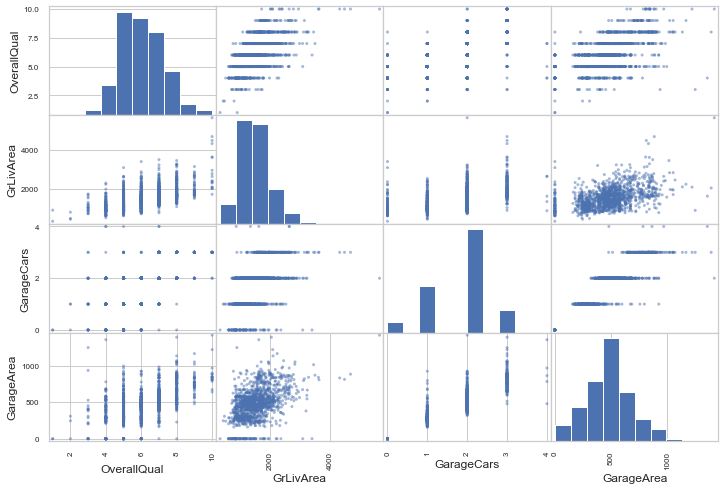

In [64]:
attributes = ['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea']
scatter_matrix(df[attributes], figsize=(12, 8))

## 4) Data Exploration Analysis

                                             |      | [  0%]   00:00 -> (? left)


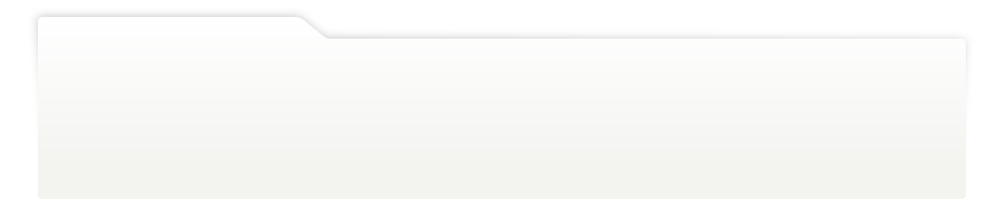
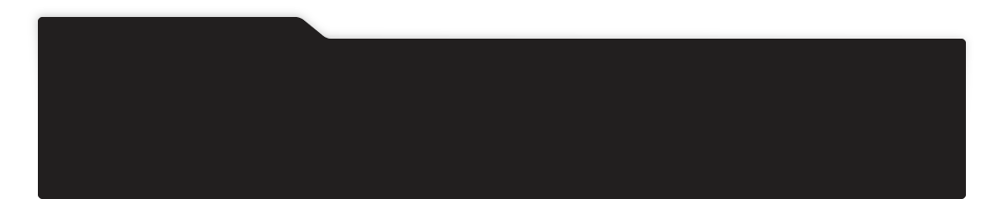
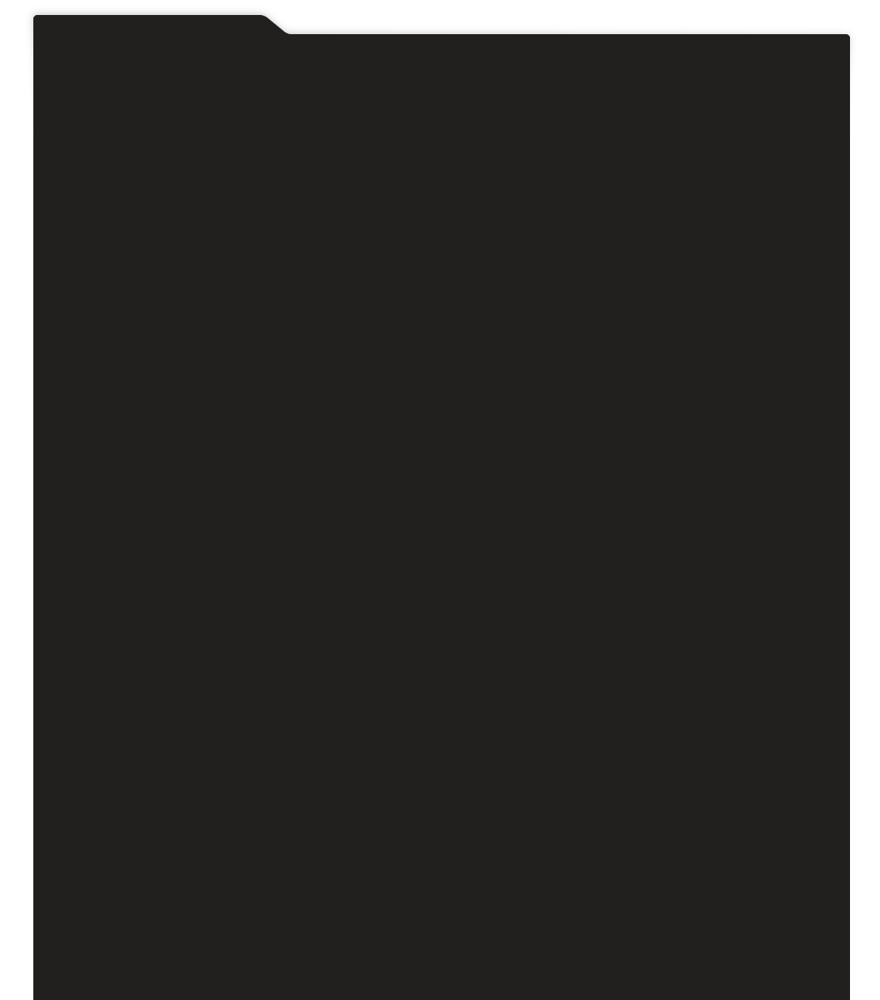
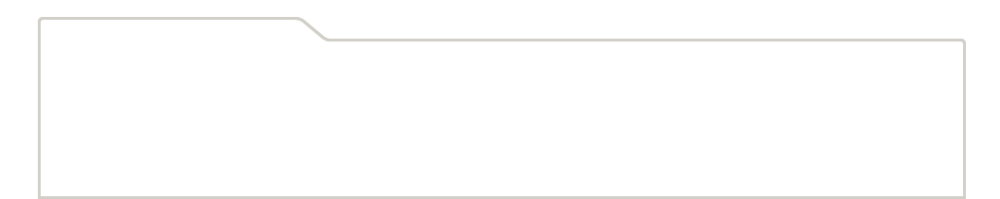
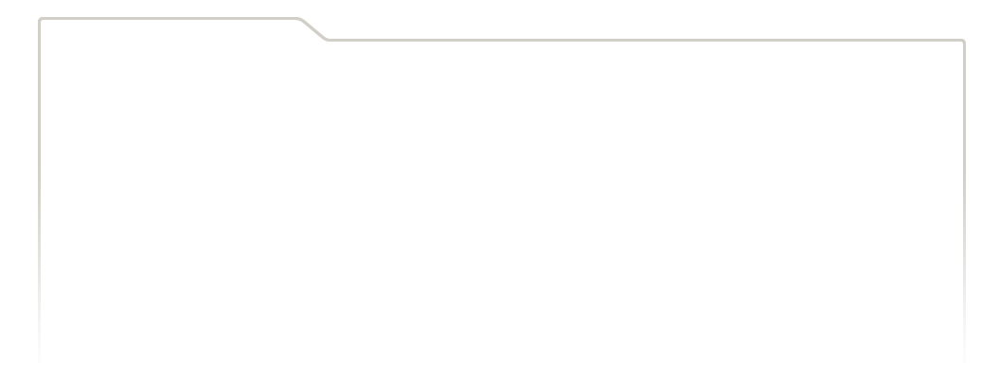
...
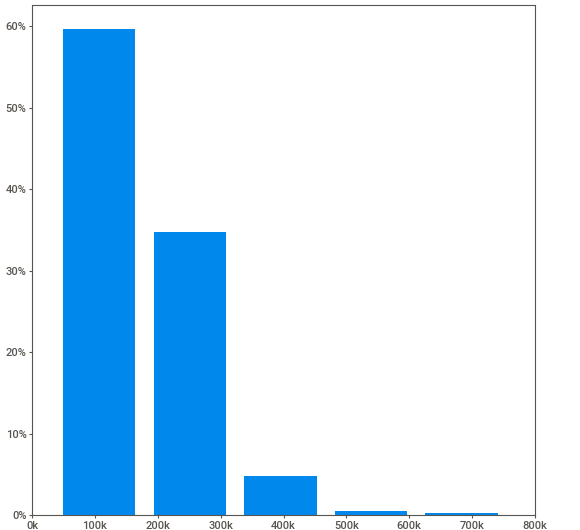
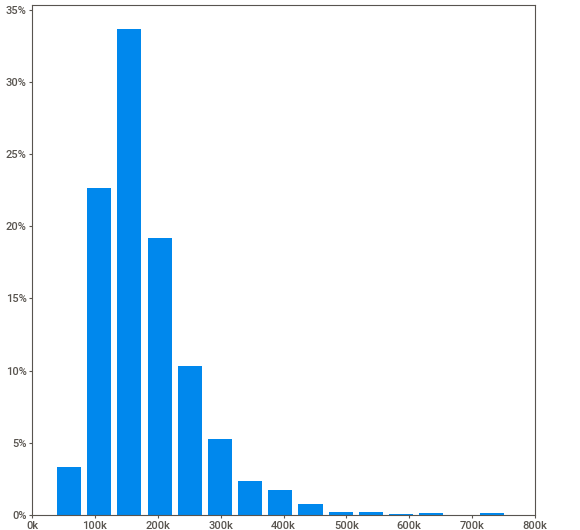
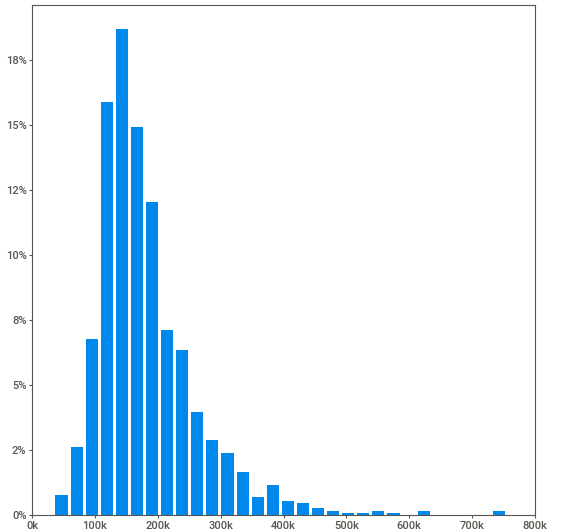
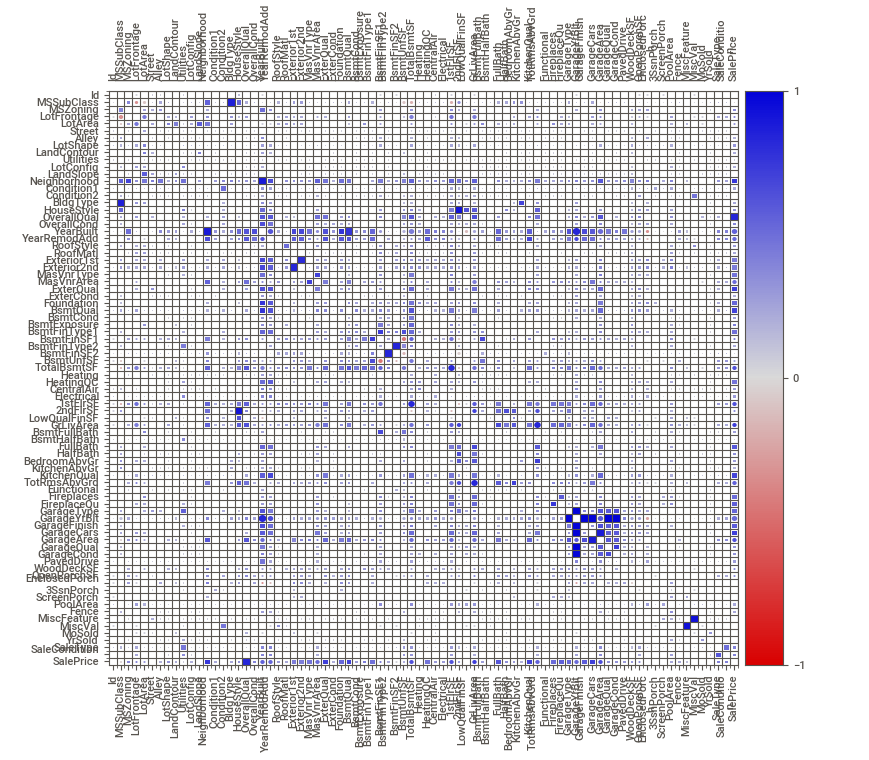
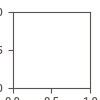

In [65]:
# Exploratory Data Analysis of Training Dataset
my_report = sv.analyze(df)
my_report.show_notebook()

                                             |      | [  0%]   00:00 -> (? left)


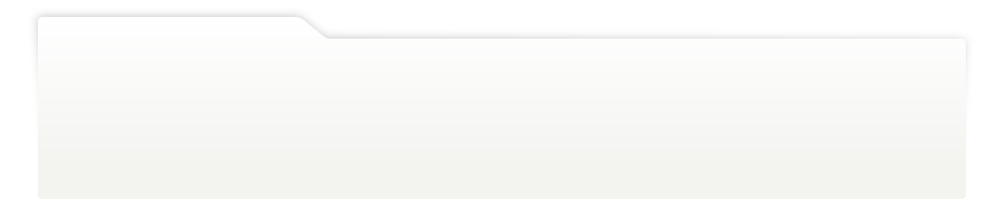
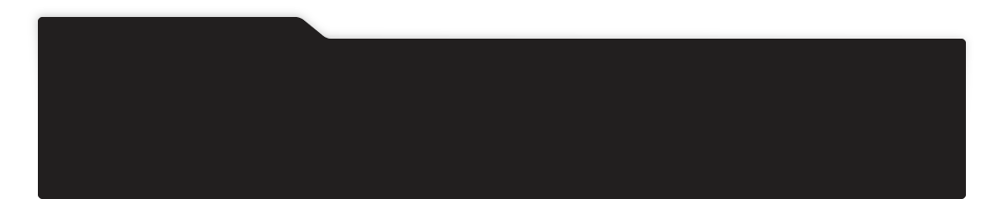
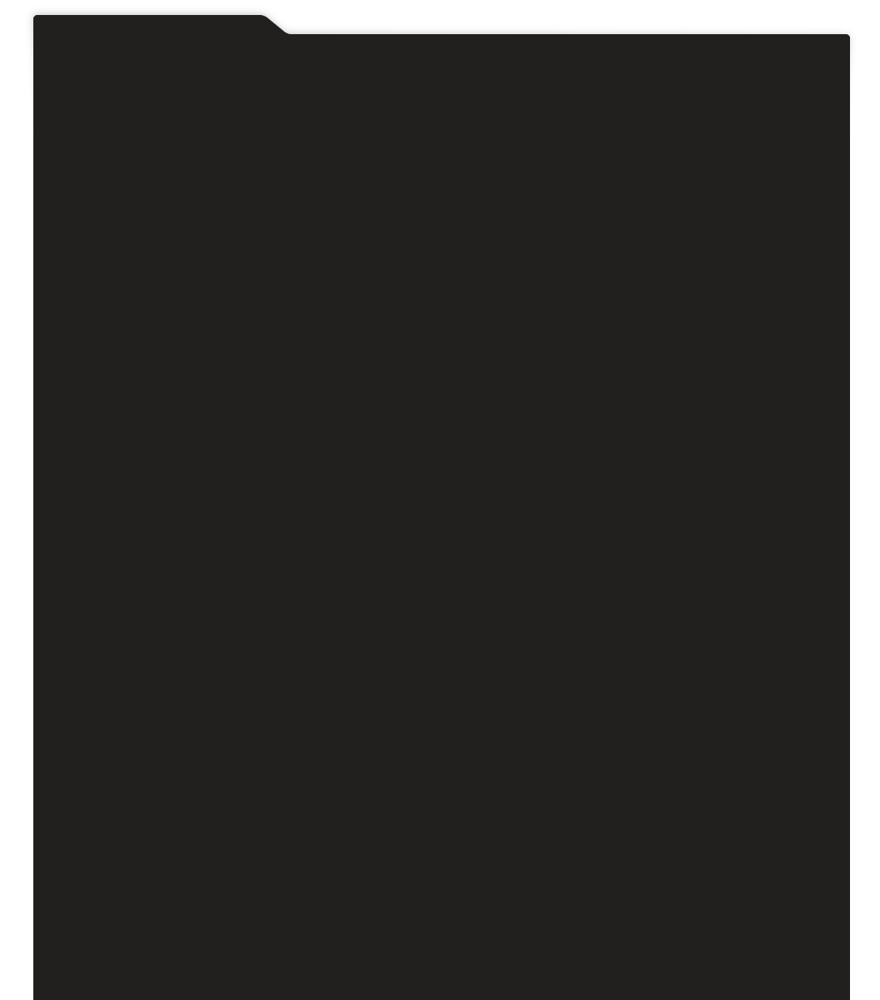
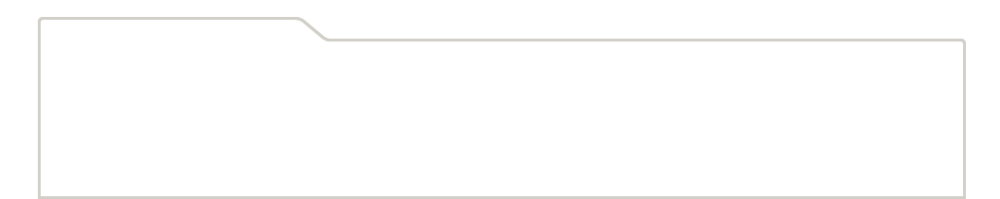
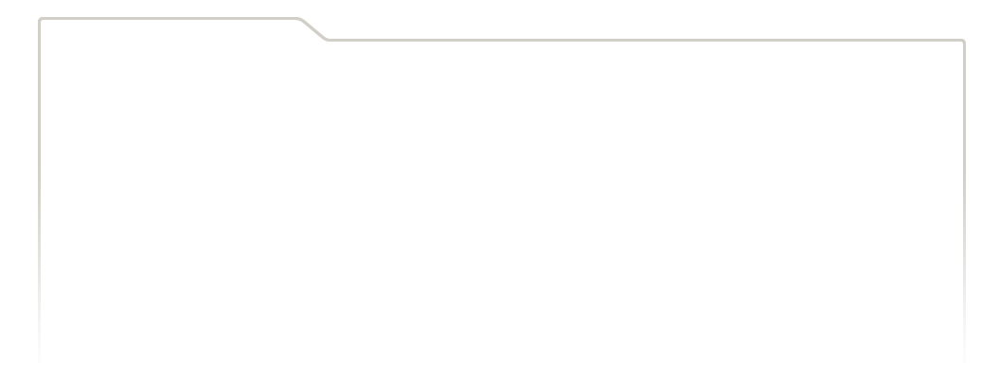
...
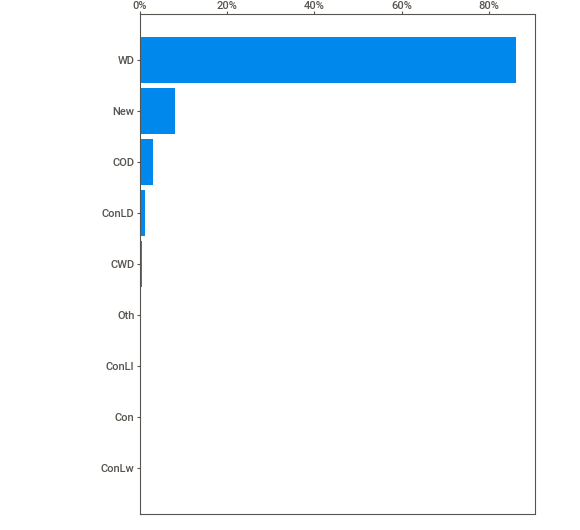
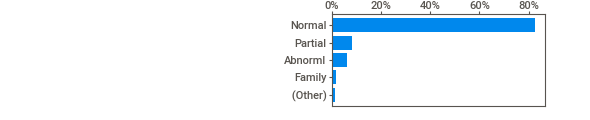
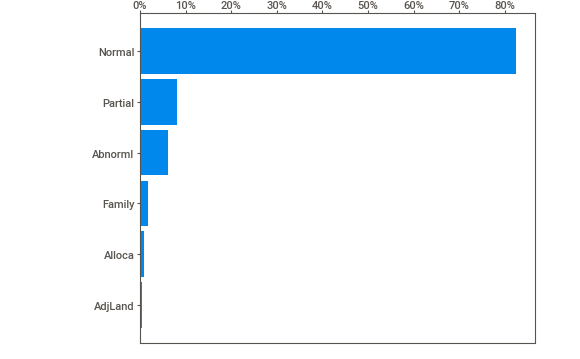
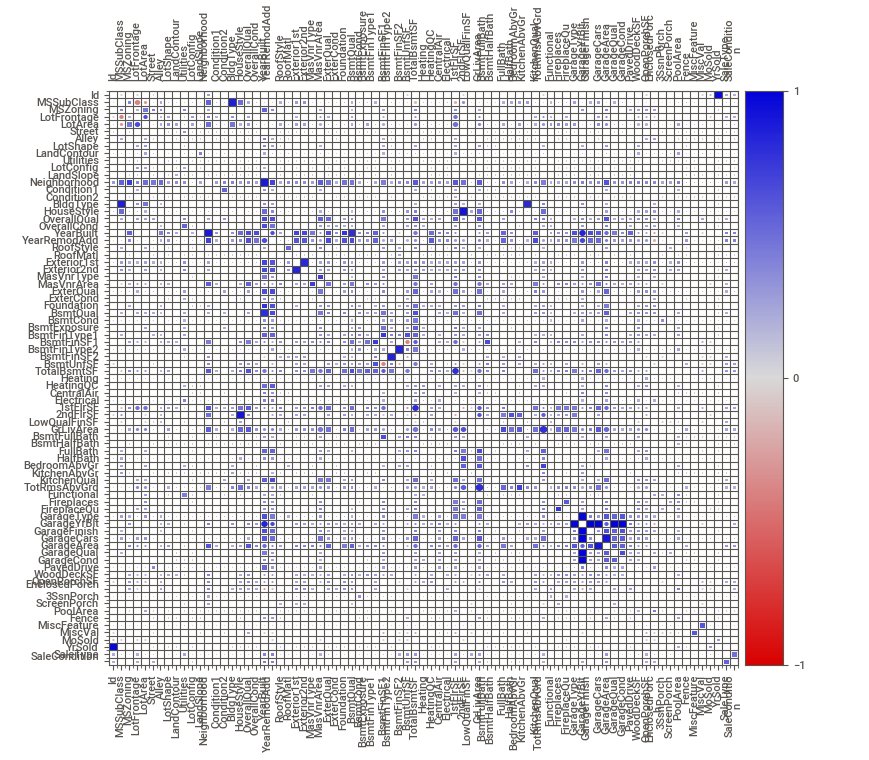
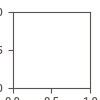

In [66]:
# Exploratory Data Analysis of Training Dataset
my_report = sv.analyze(df_test)
my_report.show_notebook()

In [67]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


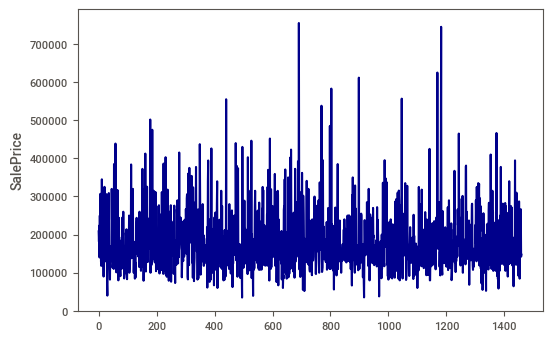

In [68]:
# Target Variable Visualization
target_feature = df['SalePrice']
figure_01 = sns.lineplot(data=target_feature, color='darkblue')
plt.show()

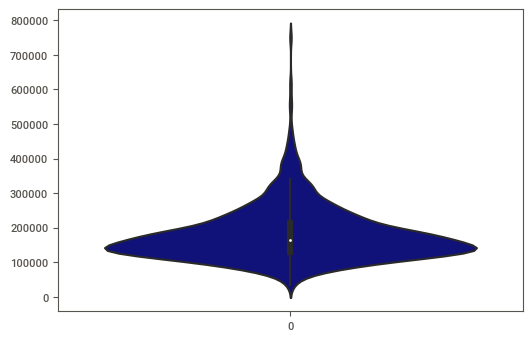

In [69]:
# Target Variable Visualization
target_feature = df['SalePrice']
figure_02 = sns.violinplot(data=target_feature, color='darkblue')
plt.show()

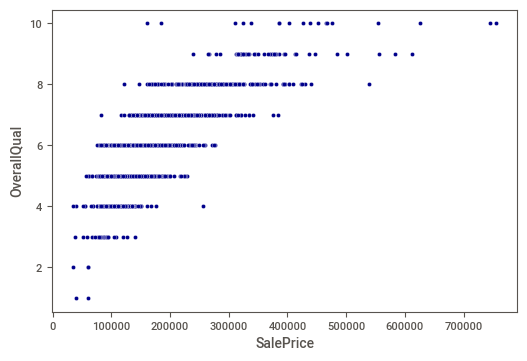

In [70]:
# Target Variable Visualization
x = df['SalePrice']
y = df['OverallQual']
figure_03 = sns.scatterplot(x=x, y=y, color='darkblue')
plt.show()

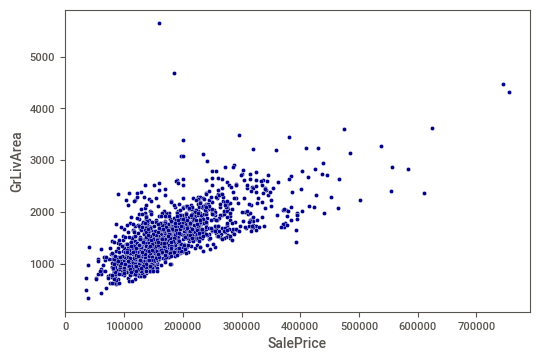

In [71]:
# Target Variable Visualization
x = df['SalePrice']
y = df['GrLivArea']
figure_04 = sns.scatterplot(x=x, y=y, color='darkblue')
plt.show()

## 5) Remove None / NaN Values

In [72]:
df = df.replace(to_replace=np.nan, value=None)
df_test = df_test.replace(to_replace=np.nan, value=None)

In [73]:
# Print the columns that have null values
null_columns = df.columns[df.isnull().any()]
print("Features with Null Values: ", len(null_columns))
print ()
print ()
print("Feature Names with Null Values:")
print(null_columns)
print ()
print ()
print ("Count of Null Values in Features:")
print(df[null_columns].isnull().sum())

Features with Null Values:  19


Feature Names with Null Values:
Index(['LotFrontage', 'Alley', 'MasVnrType', 'MasVnrArea', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Electrical', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageQual', 'GarageCond', 'PoolQC', 'Fence',
       'MiscFeature'],
      dtype='object')


Count of Null Values in Features:
LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


In [74]:
# Print the columns that have null values
null_columns = df_test.columns[df_test.isnull().any()]
print("Features with Null Values: ", len(null_columns))
print ()
print ()
print("Feature Names with Null Values:")
print(null_columns)
print ()
print ()
print ("Count of Null Values in Features:")
print(df_test[null_columns].isnull().sum())

Features with Null Values:  33


Feature Names with Null Values:
Index(['MSZoning', 'LotFrontage', 'Alley', 'Utilities', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath',
       'BsmtHalfBath', 'KitchenQual', 'Functional', 'FireplaceQu',
       'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea',
       'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType'],
      dtype='object')


Count of Null Values in Features:
MSZoning           4
LotFrontage      227
Alley           1352
Utilities          2
Exterior1st        1
Exterior2nd        1
MasVnrType        16
MasVnrArea        15
BsmtQual          44
BsmtCond          45
BsmtExposure      44
BsmtFinType1      42
BsmtFinSF1         1
BsmtFinType2      42
BsmtFinSF2         1
BsmtUnfSF          1
TotalBsmtSF        1
BsmtF

In [75]:
df['MSZoning'] = list(map(lambda x: 'RL' if x == None else (x), df['MSZoning']))
df_test['MSZoning'] = list(map(lambda x: 'RL' if x == None else (x), df_test['MSZoning']))

In [76]:
LotFrontage_mean = df['LotFrontage'].mean().round(0)
LotFrontage_mean_test = df_test['LotFrontage'].mean().round(0)
df['LotFrontage'] = list(map(lambda x: LotFrontage_mean if x == None else (x), df['LotFrontage']))
df_test['LotFrontage'] = list(map(lambda x: LotFrontage_mean_test if x == None else (x), df_test['LotFrontage']))

In [77]:
df['Alley'] = list(map(lambda x: 'NA' if x == None else (x), df['Alley']))
df_test['Alley'] = list(map(lambda x: 'NA' if x == None else (x), df_test['Alley']))

In [78]:
df['Utilities'] = list(map(lambda x: 'AllPub' if x == None else (x), df['Utilities']))
df_test['Utilities'] = list(map(lambda x: 'AllPub' if x == None else (x), df_test['Utilities']))

In [79]:
df['Exterior1st'] = list(map(lambda x: 'VinylSd' if x == None else (x), df['Exterior1st']))
df_test['Exterior1st'] = list(map(lambda x: 'VinylSd' if x == None else (x), df_test['Exterior1st']))

In [80]:
df['Exterior2nd'] = list(map(lambda x: 'VinylSd' if x == None else (x), df['Exterior2nd']))
df_test['Exterior2nd'] = list(map(lambda x: 'VinylSd' if x == None else (x), df_test['Exterior2nd']))

In [81]:
df['MasVnrType'] = list(map(lambda x: 'None' if x == None else (x), df['MasVnrType']))
df_test['MasVnrType'] = list(map(lambda x: 'None' if x == None else (x), df_test['MasVnrType']))

In [82]:
df_temp = df[df.MasVnrType != 'None']
df_temp = df_temp.dropna(subset=['MasVnrArea'])
MasVnrArea_mean = df_temp['MasVnrArea'].mean()
df['MasVnrArea'] = list(map(lambda x, y: 0 if x == None and y == 'None' else (MasVnrArea_mean if x == None else (x)), df['MasVnrArea'], df['MasVnrType']))
df_temp_test = df_test[df_test.MasVnrType != 'None']
df_temp_test = df_temp_test.dropna(subset=['MasVnrArea'])
MasVnrArea_mean_test = df_temp_test['MasVnrArea'].mean()
df_test['MasVnrArea'] = list(map(lambda x, y: 0 if x == None and y == 'None' else (MasVnrArea_mean_test if x == None else (x)), df_test['MasVnrArea'], df_test['MasVnrType']))

In [83]:
df['BsmtQual'] = list(map(lambda x: 'TA' if x == None else (x), df['BsmtQual']))
df_test['BsmtQual'] = list(map(lambda x: 'TA' if x == None else (x), df_test['BsmtQual']))

In [84]:
df['BsmtCond'] = list(map(lambda x: 'TA' if x == None else (x), df['BsmtCond']))
df_test['BsmtCond'] = list(map(lambda x: 'TA' if x == None else (x), df_test['BsmtCond']))

In [85]:
df['BsmtExposure'] = list(map(lambda x: 'No' if x == None else (x), df['BsmtExposure']))
df_test['BsmtExposure'] = list(map(lambda x: 'No' if x == None else (x), df_test['BsmtExposure']))

In [86]:
df['BsmtFinType1'] = list(map(lambda x: 'Unf' if x == None else (x), df['BsmtFinType1']))
df_test['BsmtFinType1'] = list(map(lambda x: 'Unf' if x == None else (x), df_test['BsmtFinType1']))

In [87]:
df_temp = df[~df.BsmtFinType1.isin(['Unf', 'NA'])]
df_temp = df_temp.dropna(subset=['BsmtFinSF1'])
BsmtFinSF1_mean = df_temp['BsmtFinSF1'].mean()
df['BsmtFinSF1'] = list(map(lambda x, y: 0 if x == None and y == ['Unf', 'NA'] else (BsmtFinSF1_mean if x == None else (x)), df['BsmtFinSF1'], df['BsmtFinType1']))
df_temp_test = df_test[~df_test.BsmtFinType1.isin(['Unf', 'NA'])]
df_temp_test = df_temp_test.dropna(subset=['BsmtFinSF1'])
BsmtFinSF1_mean_test = df_temp_test['BsmtFinSF1'].mean()
df_test['BsmtFinSF1'] = list(map(lambda x, y: 0 if x == None and y == 'None' else (BsmtFinSF1_mean_test if x == None else (x)), df_test['BsmtFinSF1'], df_test['BsmtFinType1']))

In [88]:
df['BsmtFinType2'] = list(map(lambda x: 'Unf' if x == None else (x), df['BsmtFinType2']))
df_test['BsmtFinType2'] = list(map(lambda x: 'Unf' if x == None else (x), df_test['BsmtFinType2']))

In [89]:
df_temp = df[~df.BsmtFinType2.isin(['Unf', 'NA'])]
df_temp = df_temp.dropna(subset=['BsmtFinSF2'])
BsmtFinSF2_mean = df_temp['BsmtFinSF2'].mean()
df['BsmtFinSF2'] = list(map(lambda x, y: 0 if x == None and y == ['Unf', 'NA'] else (BsmtFinSF2_mean if x == None else (x)), df['BsmtFinSF2'], df['BsmtFinType2']))
df_temp_test = df_test[~df_test.BsmtFinType2.isin(['Unf', 'NA'])]
df_temp_test = df_temp_test.dropna(subset=['BsmtFinSF2'])
BsmtFinSF2_mean_test = df_temp_test['BsmtFinSF2'].mean()
df_test['BsmtFinSF2'] = list(map(lambda x, y: 0 if x == None and y == 'None' else (BsmtFinSF2_mean_test if x == None else (x)), df_test['BsmtFinSF2'], df_test['BsmtFinType2']))

In [90]:
BsmtUnfSF_mean = df['BsmtUnfSF'].mean()
BsmtUnfSF_mean_test = df_test['BsmtUnfSF'].mean()
df['BsmtUnfSF'] = list(map(lambda x: BsmtUnfSF_mean if x == None else (x), df['BsmtUnfSF']))
df_test['BsmtUnfSF'] = list(map(lambda x: BsmtUnfSF_mean_test if x == None else (x), df_test['BsmtUnfSF']))

In [91]:
TotalBsmtSF_mean = df['TotalBsmtSF'].mean()
TotalBsmtSF_mean_test = df_test['TotalBsmtSF'].mean()
df['TotalBsmtSF'] = list(map(lambda x: TotalBsmtSF_mean if x == None else (x), df['TotalBsmtSF']))
df_test['TotalBsmtSF'] = list(map(lambda x: TotalBsmtSF_mean_test if x == None else (x), df_test['TotalBsmtSF']))

In [92]:
df['Electrical'] = list(map(lambda x: 'SBrkr' if x == None else (x), df['Electrical']))
df_test['Electrical'] = list(map(lambda x: 'SBrkr' if x == None else (x), df_test['Electrical']))

In [93]:
df['BsmtFullBath'] = list(map(lambda x: 0 if x == None else (x), df['BsmtFullBath']))
df_test['BsmtFullBath'] = list(map(lambda x: 0 if x == None else (x), df_test['BsmtFullBath']))

In [94]:
df['BsmtHalfBath'] = list(map(lambda x: 0 if x == None else (x), df['BsmtHalfBath']))
df_test['BsmtHalfBath'] = list(map(lambda x: 0 if x == None else (x), df_test['BsmtHalfBath']))

In [95]:
df['KitchenQual'] = list(map(lambda x: 'TA' if x == None else (x), df['KitchenQual']))
df_test['KitchenQual'] = list(map(lambda x: 'TA' if x == None else (x), df_test['KitchenQual']))

In [96]:
df['Functional'] = list(map(lambda x: 'Typ' if x == None else (x), df['Functional']))
df_test['Functional'] = list(map(lambda x: 'Typ' if x == None else (x), df_test['Functional']))

In [97]:
df['FireplaceQu'] = list(map(lambda x, y: 'NA' if x == None and y == 0 else ('TA' if x == None else (x)), df['FireplaceQu'], df['Fireplaces']))
df_test['FireplaceQu'] = list(map(lambda x, y: 'NA' if x == None and y == 0 else ('TA' if x == None else (x)), df_test['FireplaceQu'], df_test['Fireplaces']))

In [98]:
df['GarageType'] = list(map(lambda x, y: 'NA' if x == None and y == 0 else ('Attchd' if x == None else (x)), df['GarageType'], df['GarageCars']))
df_test['GarageType'] = list(map(lambda x, y: 'NA' if x == None and y == 0 else ('Attchd' if x == None else (x)), df_test['GarageType'], df_test['GarageCars']))

In [99]:
df['GarageYrBlt'] = list(map(lambda x, y: y if x == None else (x), df['GarageYrBlt'], df['YearBuilt']))
df_test['GarageYrBlt'] = list(map(lambda x, y: y if x == None else (x), df_test['GarageYrBlt'], df_test['YearBuilt']))

In [100]:
df['GarageFinish'] = list(map(lambda x, y: 'NA' if x == None and y == 'NA' else ('Unf' if x == None else (x)), df['GarageFinish'], df['GarageType']))
df_test['GarageFinish'] = list(map(lambda x, y: 'NA' if x == None and y == 'NA' else ('Unf' if x == None else (x)), df_test['GarageFinish'], df_test['GarageType']))

In [101]:
df['GarageCars'] = list(map(lambda x, y: 0 if x == None and y == 'NA' else (2 if x == None else (x)), df['GarageCars'], df['GarageType']))
df_test['GarageCars'] = list(map(lambda x, y: 0 if x == None and y == 'NA' else (2 if x == None else (x)), df_test['GarageCars'], df_test['GarageType']))

In [102]:
df_temp = df[df.GarageArea != 0]
df_temp = df_temp.dropna(subset=['GarageArea'])
GarageArea_mean = df_temp['GarageArea'].mean()
df['GarageArea'] = list(map(lambda x, y: 0 if x == None and y == 'NA' else (GarageArea_mean if x == None else (x)), df['GarageArea'], df['GarageType']))
df_temp_test = df_test[df_test.GarageArea != 0]
df_temp_test = df_temp_test.dropna(subset=['GarageArea'])
GarageArea_mean_test = df_temp_test['GarageArea'].mean()
df_test['GarageArea'] = list(map(lambda x, y: 0 if x == None and y == 'NA' else (GarageArea_mean_test if x == None else (x)), df_test['GarageArea'], df_test['GarageType']))

In [103]:
df['GarageQual'] = list(map(lambda x, y: 'NA' if x == None and y == 'NA' else ('TA' if x == None else (x)), df['GarageQual'], df['GarageType']))
df_test['GarageQual'] = list(map(lambda x, y: 'NA' if x == None and y == 'NA' else ('TA' if x == None else (x)), df_test['GarageQual'], df_test['GarageType']))

In [104]:
df['GarageCond'] = list(map(lambda x, y: 'NA' if x == None and y == 'NA' else ('TA' if x == None else (x)), df['GarageCond'], df['GarageType']))
df_test['GarageCond'] = list(map(lambda x, y: 'NA' if x == None and y == 'NA' else ('TA' if x == None else (x)), df_test['GarageCond'], df_test['GarageType']))

In [105]:
df['PoolQC'] = list(map(lambda x, y: 'NA' if x == None and y == 0 else ('TA' if x == None else (x)), df['PoolQC'], df['PoolArea']))
df_test['PoolQC'] = list(map(lambda x, y: 'NA' if x == None and y == 0 else ('TA' if x == None else (x)), df_test['PoolQC'], df_test['PoolArea']))

In [106]:
df['Fence'] = list(map(lambda x: 'NA' if x == None else (x), df['Fence']))
df_test['Fence'] = list(map(lambda x: 'NA' if x == None else (x), df_test['Fence']))

In [107]:
df['MiscFeature'] = list(map(lambda x: 'NA' if x == None else (x), df['MiscFeature']))
df_test['MiscFeature'] = list(map(lambda x: 'NA' if x == None else (x), df_test['MiscFeature']))

In [108]:
df['SaleType'] = list(map(lambda x: 'WD' if x == None else (x), df['SaleType']))
df_test['SaleType'] = list(map(lambda x: 'WD' if x == None else (x), df_test['SaleType']))

## 6) Feature Engineering

In [113]:
# Adding new Features
df["SFPerRoom"] = df["GrLivArea"] / (df["TotRmsAbvGrd"] + df["FullBath"] + df["HalfBath"] + df["KitchenAbvGr"])
df['TotalHomeQual'] = df['OverallQual'] + df['OverallCond']
df['TotalBath'] = (df['FullBath'] + (0.5 * df['HalfBath']) + df['BsmtFullBath'] + (0.5 * df['BsmtHalfBath']))
df['TotalSF'] = df['TotalBsmtSF'] + df['1stFlrSF'] + df['2ndFlrSF']
df["HighQualSF"] = df["1stFlrSF"] + df["2ndFlrSF"]
df['MonthYear'] = list(map(lambda x, y: str(x) + "-" + str(y), df['MoSold'], df['YrSold']))
df['BedroomsPerRoom'] = df['BedroomAbvGr'] / df['TotRmsAbvGrd']
df['FireplacesPerRoom'] = df['Fireplaces'] / df['TotRmsAbvGrd']
df['LiveAreaRatio'] = df['GrLivArea'] / df['LotArea']



# Adding new Categorical Features
df['BsmtFinType1_Unf'] = 1*(df['BsmtFinType1'] == 'Unf')
df['HasWoodDeck'] = (df['WoodDeckSF'] > 0) * 1
df['HasOpenPorch'] = (df['OpenPorchSF'] > 0) * 1
df['HasEnclosedPorch'] = (df['EnclosedPorch'] > 0) * 1
df['Has3SsnPorch'] = (df['3SsnPorch'] > 0) * 1
df['HasScreenPorch'] = (df['ScreenPorch'] > 0) * 1
df['YearsSinceRemodel'] = df['YrSold'].astype(int) - df['YearRemodAdd'].astype(int)
df['HasPool'] = df['PoolArea'].apply(lambda x: 1 if x > 0 else 0)
df['Has2ndFlr'] = df['2ndFlrSF'].apply(lambda x: 1 if x > 0 else 0)
df['HasGarage'] = df['GarageArea'].apply(lambda x: 1 if x > 0 else 0)
df['HasBsmt'] = df['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)
df['HasFireplaces'] = df['Fireplaces'].apply(lambda x: 1 if x > 0 else 0)
df['FinancialCrisis'] = df['YrSold'].apply(lambda x: "BeforeCrisis" if x < 2008 else ("DuringCrisis" if x < 2010 else ("AfterCrisis")))

In [114]:
# Adding new Features
df_test["SFPerRoom"] = df_test["GrLivArea"] / (df_test["TotRmsAbvGrd"] + df_test["FullBath"] + df_test["HalfBath"] + df_test["KitchenAbvGr"])
df_test['TotalHomeQual'] = df_test['OverallQual'] + df_test['OverallCond']
df_test['TotalBath'] = (df_test['FullBath'] + (0.5 * df_test['HalfBath']) + df_test['BsmtFullBath'] + (0.5 * df_test['BsmtHalfBath']))
df_test['TotalSF'] = df_test['TotalBsmtSF'] + df_test['1stFlrSF'] + df_test['2ndFlrSF']
df_test["HighQualSF"] = df_test["1stFlrSF"] + df_test["2ndFlrSF"]
df_test['MonthYear'] = list(map(lambda x, y: str(x) + "-" + str(y), df_test['MoSold'], df_test['YrSold']))
df_test['BedroomsPerRoom'] = df_test['BedroomAbvGr'] / df_test['TotRmsAbvGrd']
df_test['FireplacesPerRoom'] = df_test['Fireplaces'] / df_test['TotRmsAbvGrd']
df_test['LiveAreaRatio'] = df_test['GrLivArea'] / df_test['LotArea']


# Adding new Categorical Features
df_test['BsmtFinType1_Unf'] = 1*(df_test['BsmtFinType1'] == 'Unf')
df_test['HasWoodDeck'] = (df_test['WoodDeckSF'] > 0) * 1
df_test['HasOpenPorch'] = (df_test['OpenPorchSF'] > 0) * 1
df_test['HasEnclosedPorch'] = (df_test['EnclosedPorch'] > 0) * 1
df_test['Has3SsnPorch'] = (df_test['3SsnPorch'] > 0) * 1
df_test['HasScreenPorch'] = (df_test['ScreenPorch'] > 0) * 1
df_test['YearsSinceRemodel'] = df_test['YrSold'].astype(int) - df_test['YearRemodAdd'].astype(int)
df_test['HasPool'] = df_test['PoolArea'].apply(lambda x: 1 if x > 0 else 0)
df_test['Has2ndFlr'] = df_test['2ndFlrSF'].apply(lambda x: 1 if x > 0 else 0)
df_test['HasGarage'] = df_test['GarageArea'].apply(lambda x: 1 if x > 0 else 0)
df_test['HasBsmt'] = df_test['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)
df_test['HasFireplaces'] = df_test['Fireplaces'].apply(lambda x: 1 if x > 0 else 0)
df_test['FinancialCrisis'] = df_test['YrSold'].apply(lambda x: "BeforeCrisis" if x < 2008 else ("DuringCrisis" if x < 2010 else ("AfterCrisis")))

In [115]:
# Year Built into Decade Bins
df['YearBuiltDecades'] = pd.qcut(df['YearBuilt'], 11, labels=["Decade1","Decade2","Decade3","Decade4","Decade5","Decade6","Decade7","Decade8","Decade9","Decade10","Decade11"])
df_test['YearBuiltDecades'] = pd.qcut(df_test['YearBuilt'], 11, labels=["Decade1","Decade2","Decade3","Decade4","Decade5","Decade6","Decade7","Decade8","Decade9","Decade10","Decade11"])

In [116]:
print (df.shape)
print ()
print (df_test.shape)

(1460, 104)

(1459, 103)


## 7) One-hot Feature Encoding

In [128]:
non_numeric_features = df.select_dtypes(include=['object']).columns.tolist()
non_numeric_features_test = df_test.select_dtypes(include=['object']).columns.tolist()

In [129]:
# Create an instance of the OneHotEncoder class
encoder = OneHotEncoder()

for feature in non_numeric_features:
    one_hot = encoder.fit_transform(df[[feature]])
    one_hot_array = one_hot.toarray()
    categories = encoder.categories_
    
    
    categories_list = categories[0].tolist()
    column_list = []
    for item in categories_list:
        result = feature + "_" + item
        column_list.append(result)


    # Convert the one hot encoded array to a Pandas DataFrame
    one_hot_df = pd.DataFrame(one_hot_array, columns=column_list)

    # Use the pandas.concat function to append the one hot encoded DataFrame to the original DataFrame
    df = pd.concat([df, one_hot_df], axis=1)
    df = df.rename(columns={'MSZoning_C (all)': 'MSZoning_C'})

In [130]:
# Create an instance of the OneHotEncoder class
encoder = OneHotEncoder()

for feature in non_numeric_features_test:
    one_hot = encoder.fit_transform(df_test[[feature]])
    one_hot_array = one_hot.toarray()
    categories = encoder.categories_
    
    
    categories_list = categories[0].tolist()
    column_list = []
    for item in categories_list:
        result = feature + "_" + item
        column_list.append(result)


    # Convert the one hot encoded array to a Pandas DataFrame
    one_hot_df = pd.DataFrame(one_hot_array, columns=column_list)

    # Use the pandas.concat function to append the one hot encoded DataFrame to the original DataFrame
    df_test = pd.concat([df_test, one_hot_df], axis=1)
    df_test = df_test.rename(columns={'MSZoning_C (all)': 'MSZoning_C'})

In [131]:
df = df.drop(columns=non_numeric_features)
df_test = df_test.drop(columns=non_numeric_features_test)

In [132]:
print (df.shape)
print ()
print (df_test.shape)

(1460, 378)

(1459, 360)


## 8) Feature Selection

In [136]:
corr_matrix = df.corr()

print (corr_matrix['SalePrice'].sort_values(ascending=False))

SalePrice            1.000000
OverallQual          0.790982
TotalSF              0.782260
HighQualSF           0.716883
GrLivArea            0.708624
                       ...   
FireplaceQu_NA      -0.471908
BsmtQual_TA         -0.498545
YearsSinceRemodel   -0.509079
KitchenQual_TA      -0.519298
ExterQual_TA        -0.589044
Name: SalePrice, Length: 377, dtype: float64


In [137]:
print (corr_matrix[(corr_matrix['SalePrice'] >= 0.7)].index)

Index(['OverallQual', 'GrLivArea', 'SalePrice', 'TotalSF', 'HighQualSF'], dtype='object')


In [138]:
# Select features with a positive correlation of at least 0.5 and a negative correlation of at most -0.5
selected_features_pos = corr_matrix[(corr_matrix['SalePrice'] >= 0.2)].index
selected_features_neg = corr_matrix[(corr_matrix['SalePrice'] <= -0.2)].index

# Combine the lists into a single Series
selected_features = selected_features_pos.union(selected_features_neg)


selected_features_list = list(selected_features)
selected_features_list_train = selected_features_list


print (len(selected_features_list_train), "Features have been selected")
print ()
print (selected_features_list_train)

88 Features have been selected

['1stFlrSF', '2ndFlrSF', 'BedroomsPerRoom', 'BsmtExposure_Gd', 'BsmtExposure_No', 'BsmtFinSF1', 'BsmtFinType1_GLQ', 'BsmtFullBath', 'BsmtQual_Ex', 'BsmtQual_Gd', 'BsmtQual_TA', 'BsmtUnfSF', 'CentralAir_N', 'CentralAir_Y', 'Electrical_SBrkr', 'ExterQual_Ex', 'ExterQual_Gd', 'ExterQual_TA', 'Exterior1st_VinylSd', 'Exterior2nd_VinylSd', 'FireplaceQu_Ex', 'FireplaceQu_Gd', 'FireplaceQu_NA', 'Fireplaces', 'FireplacesPerRoom', 'Foundation_BrkTil', 'Foundation_CBlock', 'Foundation_PConc', 'FullBath', 'GarageArea', 'GarageCars', 'GarageCond_NA', 'GarageCond_TA', 'GarageFinish_Fin', 'GarageFinish_NA', 'GarageFinish_Unf', 'GarageQual_NA', 'GarageQual_TA', 'GarageType_Attchd', 'GarageType_BuiltIn', 'GarageType_Detchd', 'GarageType_NA', 'GarageYrBlt', 'GrLivArea', 'HalfBath', 'HasFireplaces', 'HasGarage', 'HasOpenPorch', 'HasWoodDeck', 'HeatingQC_Ex', 'HeatingQC_TA', 'HighQualSF', 'HouseStyle_2Story', 'KitchenQual_Ex', 'KitchenQual_Gd', 'KitchenQual_TA', 'LotArea', 

In [139]:
df_train = df[selected_features_list_train]

In [140]:
selected_features_list_test = selected_features_list
selected_features_list_test.remove('SalePrice')

print (len(selected_features_list_train), "Features have been selected")
print ()
print (selected_features_list_test)

87 Features have been selected

['1stFlrSF', '2ndFlrSF', 'BedroomsPerRoom', 'BsmtExposure_Gd', 'BsmtExposure_No', 'BsmtFinSF1', 'BsmtFinType1_GLQ', 'BsmtFullBath', 'BsmtQual_Ex', 'BsmtQual_Gd', 'BsmtQual_TA', 'BsmtUnfSF', 'CentralAir_N', 'CentralAir_Y', 'Electrical_SBrkr', 'ExterQual_Ex', 'ExterQual_Gd', 'ExterQual_TA', 'Exterior1st_VinylSd', 'Exterior2nd_VinylSd', 'FireplaceQu_Ex', 'FireplaceQu_Gd', 'FireplaceQu_NA', 'Fireplaces', 'FireplacesPerRoom', 'Foundation_BrkTil', 'Foundation_CBlock', 'Foundation_PConc', 'FullBath', 'GarageArea', 'GarageCars', 'GarageCond_NA', 'GarageCond_TA', 'GarageFinish_Fin', 'GarageFinish_NA', 'GarageFinish_Unf', 'GarageQual_NA', 'GarageQual_TA', 'GarageType_Attchd', 'GarageType_BuiltIn', 'GarageType_Detchd', 'GarageType_NA', 'GarageYrBlt', 'GrLivArea', 'HalfBath', 'HasFireplaces', 'HasGarage', 'HasOpenPorch', 'HasWoodDeck', 'HeatingQC_Ex', 'HeatingQC_TA', 'HighQualSF', 'HouseStyle_2Story', 'KitchenQual_Ex', 'KitchenQual_Gd', 'KitchenQual_TA', 'LotArea', 

In [141]:
# ID list for later usage in Submission CSV
id_list = df_test['Id']
X_test = df_test[selected_features_list_test]

In [142]:
print (df_train.shape)
print ()
print (X_test.shape)

(1460, 88)

(1459, 87)


In [143]:
print (df_train.head())
print ()
print ()
print (df_train.dtypes)

   1stFlrSF  2ndFlrSF  BedroomsPerRoom  BsmtExposure_Gd  BsmtExposure_No  \
0       856       854         0.375000              0.0              1.0   
1      1262         0         0.500000              1.0              0.0   
2       920       866         0.500000              0.0              0.0   
3       961       756         0.428571              0.0              1.0   
4      1145      1053         0.444444              0.0              0.0   

   BsmtFinSF1  BsmtFinType1_GLQ  BsmtFullBath  BsmtQual_Ex  BsmtQual_Gd  ...  \
0         706               1.0             1          0.0          1.0  ...   
1         978               0.0             0          0.0          1.0  ...   
2         486               1.0             1          0.0          1.0  ...   
3         216               0.0             1          0.0          0.0  ...   
4         655               1.0             1          0.0          1.0  ...   

   SaleType_WD  TotRmsAbvGrd  TotalBath  TotalBsmtSF  TotalHom

In [144]:
print (X_test.head())
print ()
print ()
print (X_test.dtypes)

   1stFlrSF  2ndFlrSF  BedroomsPerRoom  BsmtExposure_Gd  BsmtExposure_No  \
0       896         0         0.400000              0.0              1.0   
1      1329         0         0.500000              0.0              1.0   
2       928       701         0.500000              0.0              1.0   
3       926       678         0.428571              0.0              1.0   
4      1280         0         0.400000              0.0              1.0   

   BsmtFinSF1  BsmtFinType1_GLQ  BsmtFullBath  BsmtQual_Ex  BsmtQual_Gd  ...  \
0       468.0               0.0           0.0          0.0          0.0  ...   
1       923.0               0.0           0.0          0.0          0.0  ...   
2       791.0               1.0           0.0          0.0          1.0  ...   
3       602.0               1.0           0.0          0.0          0.0  ...   
4       263.0               0.0           0.0          0.0          1.0  ...   

   SaleType_WD  TotRmsAbvGrd  TotalBath  TotalBsmtSF  TotalHom

In [145]:
# Count the number of NaN values in each column
nan_counts = df_train.isnull().sum()

# Print the NaN counts for each column
print(nan_counts)

1stFlrSF             0
2ndFlrSF             0
BedroomsPerRoom      0
BsmtExposure_Gd      0
BsmtExposure_No      0
                    ..
TotalSF              0
WoodDeckSF           0
YearBuilt            0
YearRemodAdd         0
YearsSinceRemodel    0
Length: 88, dtype: int64


In [146]:
# Count the number of NaN values in each column
nan_counts = X_test.isnull().sum()

# Print the NaN counts for each column
print(nan_counts)

1stFlrSF             0
2ndFlrSF             0
BedroomsPerRoom      0
BsmtExposure_Gd      0
BsmtExposure_No      0
                    ..
TotalSF              0
WoodDeckSF           0
YearBuilt            0
YearRemodAdd         0
YearsSinceRemodel    0
Length: 87, dtype: int64


## 9) Dataset Preparation for ML Algorithms

In [147]:
# Split of X and y for Training Dataset
X= df_train.loc[:, df_train.columns != 'SalePrice']
y = df_train.loc[:, df_train.columns == 'SalePrice']

In [149]:
# For final data support
X_train = X
y_train = y

## 10) XG Boost Regression

In [150]:
# Create a XGBoost regression model
model = xgb.XGBRegressor(n_estimators=2500, learning_rate=0.025, max_depth=4)

# Fit the model to the data
model.fit(X_train, y_train)

# Make predictions
predictions = model.predict(X_test)

In [151]:
# XGBoost Regressor
xgboost = XGBRegressor(colsample_bytree=0.4603, 
                       gamma=0.0468, 
                       learning_rate=0.025, 
                       max_depth=4,
                       min_child_weight=1.7817, 
                       n_estimators=2200,
                       reg_alpha=0.4640, 
                       reg_lambda=0.8571,
                       subsample=0.5213, 
                       silent=1,
                       random_state =7, 
                       nthread = -1)

In [152]:
# Define the parameters to search
param_grid = {'n_estimators': [100,150,200,250,300,350,400,450,500],
              'learning_rate': [0.2,0.1,0.075,0.05,0.025,0.01,0.005],
              'max_depth': [3,4,5,6,7,8,9]}

# Create a XGBoost regression model
model = xgb.XGBRegressor()

# Use grid search to tune the hyperparameters
grid_search = GridSearchCV(model, param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Print the best parameters and the best score
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)

KeyboardInterrupt: 

In [ ]:
model = grid_search

# Make predictions
predictions = model.predict(X_test)

In [ ]:
# Evaluate the model using accuracy metrics
accuracy_train = model.score(X_train, y_train)
accuracy_val = model.score(X_val, y_val)
print("Train Set Accuracy: ", round((accuracy_train*100), 2))
print ()
print ()
print("Validation Set Accuracy: ", round((accuracy_val*100), 2))

In [ ]:
df_result = pd.DataFrame()
df_result['Id'] = id_list
df_result['SalePrice'] = predictions

In [ ]:
df_result.to_csv('Submission.csv', index=False)

## 11) Model Stacking & Blending

In [ ]:
X = X_train
train_labels = y_train

In [ ]:
# Setup cross validation folds
kf = KFold(n_splits=12, random_state=42, shuffle=True)

In [ ]:
# Define error metrics
def rmsle(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

def cv_rmse(model, X=X):
    rmse = np.sqrt(-cross_val_score(model, X, train_labels, scoring="neg_mean_squared_error", cv=kf))
    return (rmse)

In [ ]:
# Light Gradient Boosting Regressor
lightgbm = LGBMRegressor(objective='regression',
                         boosting_type='gbdt',
                       learning_rate=0.03,
                         num_leaves =106,
                       n_estimators=6000,
                         max_depth = 4,
                         min_child_samples = 1,
                         min_split_gain=0, 
                       subsample=0.4,
                       subsample_freq=3, 
                       colsample_bytree=0.6,
                         reg_alpha=0.008,
                         reg_lambda=0.03,
                       verbose=-1,
                       random_state=42)

# XGBoost Regressor
xgboost = XGBRegressor(colsample_bytree=0.4603, 
                       gamma=0.0468, 
                       learning_rate=0.05, 
                       max_depth=3,
                       min_child_weight=1.7817, 
                       n_estimators=2200,
                       reg_alpha=0.4640, 
                       reg_lambda=0.8571,
                       subsample=0.5213, 
                       silent=1,
                       random_state =7, 
                       nthread = -1)


# Ridge Regressor
ridge_alphas = [1e-15, 1e-10, 1e-8, 9e-4, 7e-4, 5e-4, 3e-4, 1e-4, 1e-3, 5e-2, 1e-2, 0.1, 0.3, 1, 3, 5, 10, 15, 18, 20, 30, 50, 75, 100]
ridge = make_pipeline(RobustScaler(), RidgeCV(alphas=ridge_alphas, cv=kf))


# Gradient Boosting Regressor
gbr = GradientBoostingRegressor(n_estimators=6000,
                                learning_rate=0.01,
                                max_depth=4,
                                max_features='sqrt',
                                min_samples_leaf=15,
                                min_samples_split=10,
                                loss='huber',
                                random_state=42)  

# Random Forest Regressor
rf = RandomForestRegressor(n_estimators=1200,
                          max_depth=15,
                          min_samples_split=5,
                          min_samples_leaf=5,
                          max_features=None,
                          oob_score=True,
                          random_state=42)

# Cat Bosst Regressor
catb = CatBoostRegressor(verbose=False)

# Stack up all the models above, optimized using xgboost
stack_gen = StackingCVRegressor(regressors=(xgboost, lightgbm, ridge, gbr, rf, catb),
                                meta_regressor=xgboost,
                                use_features_in_secondary=True)

# Initiating Scores Dict
scores = {}

In [ ]:
score = cv_rmse(lightgbm)
print("lightgbm: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['lgb'] = (score.mean(), score.std())

In [ ]:
score = cv_rmse(xgboost)
print("xgboost: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['xgb'] = (score.mean(), score.std())

In [ ]:
score = cv_rmse(ridge)
print("ridge: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['ridge'] = (score.mean(), score.std())

In [ ]:
score = cv_rmse(rf)
print("rf: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['rf'] = (score.mean(), score.std())

In [ ]:
score = cv_rmse(gbr)
print("gbr: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['gbr'] = (score.mean(), score.std())

In [ ]:
score = cv_rmse(catb)
print("cat: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['cat'] = (score.mean(), score.std())

In [ ]:
score = cv_rmse(stack_gen)
print("stack_gen: {:.4f} ({:.4f})".format(score.mean(), score.std()))
scores['stack_gen'] = (score.mean(), score.std())

In [ ]:
print('stack_gen')
stack_gen_model = stack_gen.fit(np.array(X), np.array(train_labels))
print('lightgbm')
lgb_model_full_data = lightgbm.fit(X, train_labels)
print('xgboost')
xgb_model_full_data = xgboost.fit(X, train_labels)
print('Ridge')
ridge_model_full_data = ridge.fit(X, train_labels)
print('RandomForest')
rf_model_full_data = rf.fit(X, train_labels)
print('GradientBoosting')
gbr_model_full_data = gbr.fit(X, train_labels)
print('CatBoosting')
cat_model_full_data = catb.fit(X, train_labels)

In [ ]:
final_cv_score = pd.DataFrame(scores).T.reset_index()
final_cv_score.columns =['Regressors', 'RMSE_mean', 'std_mean']
final_cv_score

In [ ]:
plt.figure(figsize = (10,6))
ax = sns.barplot(final_cv_score.sort_values('RMSE_mean')['Regressors'],final_cv_score.sort_values('RMSE_mean')['RMSE_mean'])
plt.ylim(25000, 85000)
plt.xlabel('Regressors', fontsize = 12)
plt.ylabel('CV_Mean_RMSE', fontsize = 12)
ax.bar_label(ax.containers[0], padding=3)
ax.margins(y=0.3)
plt.xticks(rotation=45)
plt.show()

In [ ]:
models=[]
models.append(ridge_model_full_data)
models.append(cat_model_full_data)
models.append(gbr_model_full_data)
models.append(xgb_model_full_data)
models.append(lgb_model_full_data)
models.append(rf_model_full_data)
models.append(stack_gen_model)

In [ ]:
# Blend models in order to make the final predictions more robust to overfitting
def blended_predictions(X):
    
    y_pred = ((0.4 * xgb_model_full_data.predict(X)) + \
    (0.2 * cat_model_full_data.predict(X)) + \
    (0.4 * lgb_model_full_data.predict(X)))
    
    df = pd.DataFrame(y_pred)
    
    mean_df = df.mean(axis=1)
    
    return (mean_df)

In [ ]:
# Get final precitions from the blended model
blended_score = rmsle(train_labels, blended_predictions(X))
scores['blended'] = (blended_score, 0)
print('RMSLE score on train data:')
print(blended_score)

In [ ]:
# Plot the predictions for each model
sns.set_style("white")
fig = plt.figure(figsize=(18, 12))

ax = sns.pointplot(x=list(scores.keys()), y=[score for score, _ in scores.values()], markers=['o'], linestyles=['-'])
for i, score in enumerate(scores.values()):
    ax.text(i, score[0] + 0.002, '{:.6f}'.format(score[0]), horizontalalignment='left', size='large', color='black', weight='semibold')

plt.ylabel('Score (RMSE)', size=20, labelpad=12.5)
plt.xlabel('Model', size=20, labelpad=12.5)
plt.tick_params(axis='x', labelsize=13.5)
plt.tick_params(axis='y', labelsize=12.5)

plt.title('Scores of Models', size=20)

plt.show()

In [ ]:
sub = pd.DataFrame()
sub['Id'] = id_list
sub['SalePrice'] = blended_predictions(X_test)
sub.to_csv('submission.csv',index=False)